In [3]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import os
from adjustText import adjust_text
import matplotlib.patches as patches

In [162]:
sc.set_figure_params(facecolor="white", figsize=(5, 5), format = 'pdf',dpi_save=300)
sc.settings.verbosity = 'error'

In [5]:
def select_multislide(adata, s, s_col='sample'):

    slides = adata[adata.obs[s_col].isin(s), :]
    s_keys = list(slides.uns['spatial'].keys())
    
    uns_dict = {}
    for ss in s:
        s_spatial=np.array(s_keys)[[ss in k for k in s_keys]][0]
        uns_dict[s_spatial]=slides.uns['spatial'][s_spatial]
    
    slides.uns['spatial'] = uns_dict

    return slides

In [6]:
all_vis = sc.read_h5ad('/nfs/team205/heart/anndata_objects/8regions/visium-FFPE_adult-8reg_raw.h5ad')
all_vis

AnnData object with n_obs × n_vars = 11312 × 17922
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'annotation_JC', 'sangerID', 'Publication', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'region_cell2loc'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL'
    uns: 'spatial'
    obsm: 'MT', 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [7]:
slides = select_multislide(all_vis,s = ['HCAHeartST11702008', 'HCAHeartST11702009', 'HCAHeartST11702010', 'HCAHeartST11702011'])

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [8]:
slides.X.data[:10]

array([2., 2., 4., 1., 6., 2., 1., 3., 1., 3.], dtype=float32)

In [8]:
# Normalise data
# Each spot has its count number normalised, with the count of the median spot being the reference (if target_sum argument not specified)
sc.pp.normalize_total(slides, inplace=True)
sc.pp.log1p(slides)

#Replace gene symbols
slides.var.set_index('SYMBOL',inplace=True)
slides.var_names = slides.var_names.astype('str')
slides.var_names_make_unique()

In [9]:
slides.X.data[:10]

array([0.68116194, 0.68116194, 1.0825999 , 0.39749092, 1.3682622 ,
       0.68116194, 0.39749092, 0.9018911 , 0.39749092, 0.9018911 ],
      dtype=float32)

In [10]:
slides.var.head(1)

,gene_ids,feature_types,genome,SYMBOL
ENSG00000187634,ENSG00000187634,Gene Expression,GRCh38,SAMD11


In [12]:
gene_list = ['PRPH', 'NEFL','NEFM', 'NEFH']
sc.tl.score_genes(slides, gene_list = gene_list, score_name = 'nerve_score')

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


<AxesSubplot:>

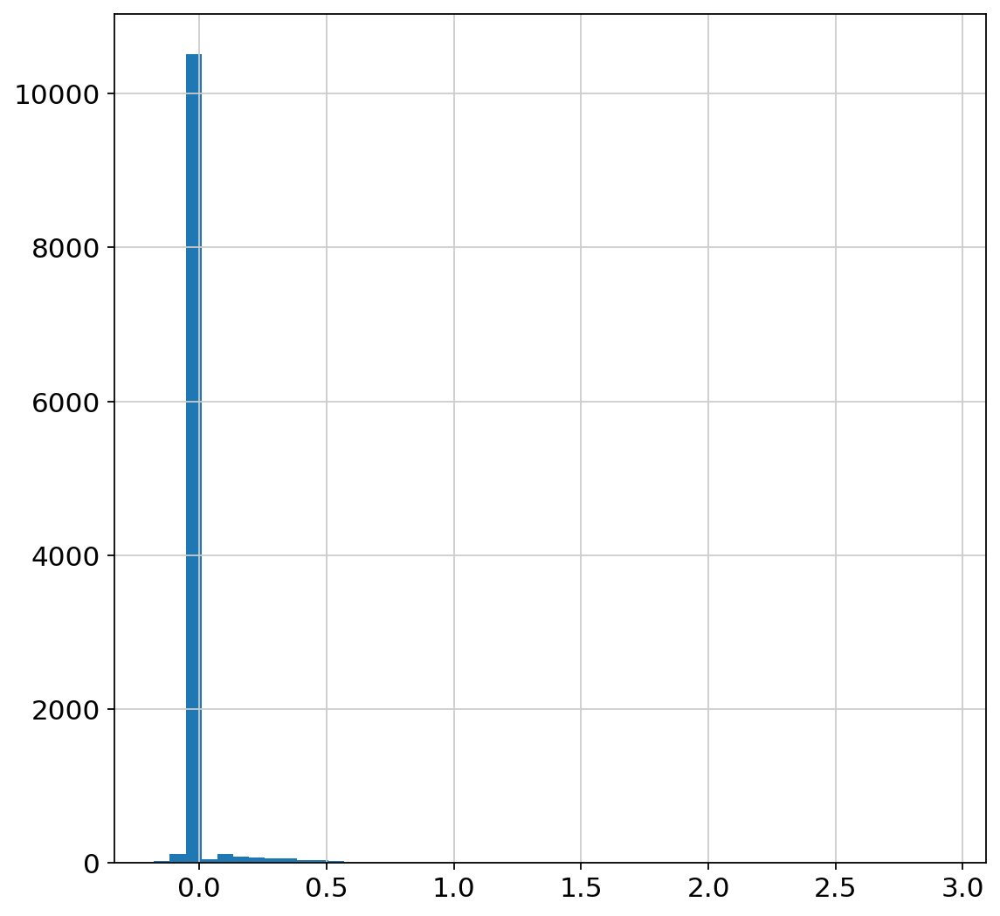

In [13]:
slides.obs['nerve_score'].hist(bins = 50)

In [17]:
# since the nerve score includes negative values, export the coutn matrix, add an adjustment factor (to make all positive), then carry on with analysis
gene_data = slides.to_df()
adj_nerve = np.absolute(np.min(slides.obs['nerve_score']))
print(adj_nerve)
nerve_score = slides.obs['nerve_score'].to_frame()
df2 = gene_data.join(nerve_score)
df2.head(3)

0.17863889694213866


,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1,HES4,ISG15,AGRN,RNF223,C1orf159,...,SPATC1L,LSS,MCM3AP,YBEY,C21orf58,PCNT,DIP2A,S100B,PRMT2,nerve_score
spot_id,,,,,,,,,,,,,,,,,,,,,
HCAHeartST11702008_AAACAAGTATCTCCCA-1,0.000000,0.681162,0.0,0.0,0.681162,1.082600,0.000000,0.000000,0.0,0.000000,...,0.000000,0.681162,0.000000,0.000000,0.0,0.000000,0.397491,0.0,0.397491,-0.011925
HCAHeartST11702008_AAACACCAATAACTGC-1,0.000000,0.000000,0.0,0.0,0.000000,1.595281,0.000000,1.086829,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,-0.005434
HCAHeartST11702008_AAACAGAGCGACTCCT-1,0.000000,0.000000,0.0,0.0,0.000000,0.000000,1.146905,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,-0.017204
HCAHeartST11702008_AAACAGCTTTCAGAAG-1,0.501744,0.501744,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.501744,...,0.000000,0.000000,0.000000,0.501744,0.0,0.501744,0.501744,0.0,0.000000,-0.024241
HCAHeartST11702008_AAACAGGGTCTATATT-1,0.000000,0.000000,0.0,0.0,0.879358,0.879358,0.533375,0.000000,0.0,0.000000,...,0.879358,0.000000,0.533375,0.000000,0.0,0.879358,0.879358,0.0,0.533375,-0.031066


In [18]:
# for each gene, calculate correlation with the nerve score
from scipy import stats
genes = df2.columns.tolist()

gene_mean_exp = []
gene_nerve_corr = []
gene_nerve_corr_pval = []
gene_names = []

for gene in genes:
    if gene in df2.columns:
        gene_nerve_corr.append(stats.pearsonr(df2[gene], df2['nerve_score'])[0])
        gene_nerve_corr_pval.append(stats.pearsonr(df2[gene], df2['nerve_score'])[1])
        gene_names.append(gene)
        gene_mean_exp.append(np.mean(df2[gene]))
    else:
        gene_nerve_corr.append('na')
        gene_nerve_corr_pval.append('na')
        gene_mean_exp.append('na')
        gene_names.append(gene)

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


In [32]:
# make a df of the genes and their correlation
d = {'gene_symbol':gene_names,'geneexp_nervescore_corr':gene_nerve_corr, 'geneexp_nervescore_corr_pval':gene_nerve_corr_pval, 'gene_meanexp':gene_mean_exp}
corr_df_gene = pd.DataFrame(d)
corr_df_gene = corr_df_gene.replace('na', np.nan)
corr_df_gene.sort_values(by=['geneexp_nervescore_corr'], ascending=False).head(5)

,gene_symbol,geneexp_nervescore_corr,geneexp_nervescore_corr_pval,gene_meanexp
17922,nerve_score,1.000000,0.0,0.000032
11402,PRPH,0.815721,0.0,0.035454
8051,NEFL,0.791683,0.0,0.026980
8050,NEFM,0.629715,0.0,0.017167
8252,STMN2,0.583782,0.0,0.040333


In [23]:
# search for some specific genes
corr_df_gene[corr_df_gene['gene_symbol'].isin(['TENM1','TENM2','TENM3','TENM4','NRXN1','NRXN2','NRXN3','NGFR','FLRT1','FLRT2','FLRT3','CBLN1','CBLN2','CBLN3','CBLN4','C1QL1','C1QL2','C1QL3','C1QL4','CNTN1','CNTN2','CNTN3','CNTN4','CNTN5','CNTN6','SSTR1','SSTR2','SSTR3','SSTR4','SSTR5','GALR1','GALR2','GALR3','ADGRL1','ADGRL2','ADGRL3','ADGRL4','CLSTN1','CLSTN2','CLSTN3','LRTM1','LRTM2','LRTM3','LRTM4','DAG1','NLGN1','NLGN2','NLGN3','NLGN4X','NLGN4Y'])].sort_values(by=['geneexp_nervescore_corr'], ascending=False)

,gene_symbol,geneexp_nervescore_corr,geneexp_nervescore_corr_pval,gene_meanexp
15549,GALR1,0.135839,9.990685e-48,0.003171
11342,CNTN1,0.109413,1.800172e-31,0.003424
14969,NGFR,0.095404,2.725282e-24,0.390902
1553,CNTN2,0.070850,4.554189e-14,0.013374
2408,C1QL2,0.047139,5.278837e-07,0.000805
9860,NRXN2,0.035779,1.411164e-04,0.034470
7766,TENM1,0.029660,1.605127e-03,0.002442
3358,LRTM1,0.026271,5.200646e-03,0.001416
10080,TENM4,0.016234,8.424235e-02,0.006873
12828,NRXN3,0.015883,9.118423e-02,0.034901


[]

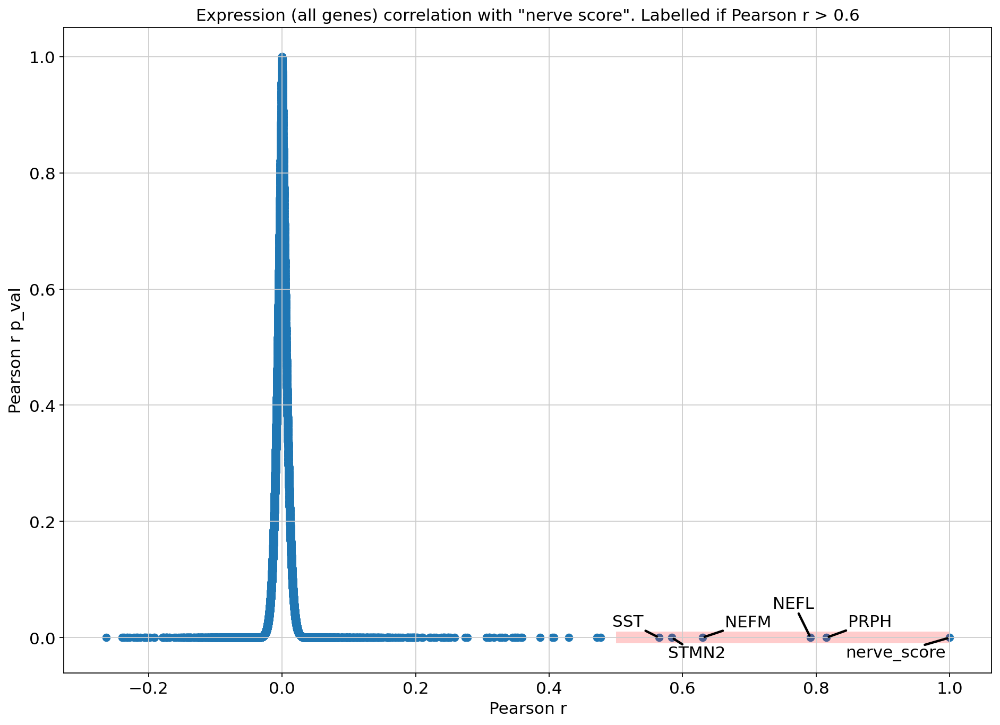

In [25]:
fig, ax = plt.subplots(figsize= (14, 10))

ax.set_ylabel('Pearson r p_val')
ax.set_xlabel('Pearson r')
ax.set_title(str('Expression (all genes) correlation with "nerve score". Labelled if Pearson r > 0.6'))

ax.scatter(corr_df_gene['geneexp_nervescore_corr'], corr_df_gene['geneexp_nervescore_corr_pval'])

TEXTS = []

for i in range(corr_df_gene.shape[0]):
    if corr_df_gene['geneexp_nervescore_corr'].iloc[i] >0.5:
        x = corr_df_gene['geneexp_nervescore_corr'].iloc[i]
        y = corr_df_gene['geneexp_nervescore_corr_pval'].iloc[i]
        text = corr_df_gene['gene_symbol'].iloc[i]
        TEXTS.append(ax.text(x, y, text, fontsize=14))

adjust_text(
    TEXTS,
    force_text = 0.25,
    force_points = 0.2,
    expand_points=(2, 2),
    arrowprops=dict(
        arrowstyle="-", 
        lw=2
    ),
    ax=fig.axes[0]
)

rect = patches.Rectangle((0.5,-0.01), 0.5, 0.02, linewidth=1, edgecolor='none', facecolor='r', alpha= 0.2)
ax.add_patch(rect)
plt.plot()

In [33]:
from scipy import stats
ligs_df = pd.read_csv('/home/jovyan/notebooks/suspension/scanpy_clustering/marker_lists/HGNC/JC_Ligand_List.csv')
ligs = ligs_df['Approved symbol'].tolist()

lig_mean_exp = []
lig_nerve_corr = []
lig_nerve_corr_pval = []
lig_names = []

for lig in ligs:
    if lig in df2.columns:
        lig_nerve_corr.append(stats.pearsonr(df2[lig], df2['nerve_score'])[0])
        lig_nerve_corr_pval.append(stats.pearsonr(df2[lig], df2['nerve_score'])[1])
        lig_names.append(lig)
        lig_mean_exp.append(np.mean(df2[lig]))
    else:
        lig_nerve_corr.append('na')
        lig_nerve_corr_pval.append('na')
        lig_mean_exp.append('na')
        lig_names.append(lig)

        
d = {'lig_symbol':lig_names,'ligexp_nervescore_corr':lig_nerve_corr, 'ligexp_nervescore_corr_pval':lig_nerve_corr_pval, 'lig_meanexp':lig_mean_exp}
corr_df = pd.DataFrame(d)
corr_df = corr_df.replace('na', np.nan)
corr_df.sort_values(by=['ligexp_nervescore_corr'], ascending=False).head(5)

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


,lig_symbol,ligexp_nervescore_corr,ligexp_nervescore_corr_pval,lig_meanexp
212,SST,0.564710,0.000000e+00,0.053204
305,SLC10A4,0.404592,0.000000e+00,0.005832
302,SLC18A3,0.329269,3.311515e-284,0.003069
301,SLC5A7,0.241746,3.970564e-150,0.006335
196,NPY,0.195414,9.167583e-98,0.012947


In [134]:
corr_df[corr_df['ligexp_nervescore_corr']>0.05]

,lig_symbol,ligexp_nervescore_corr,ligexp_nervescore_corr_pval,lig_meanexp
168,GAL,0.100518,8.486110e-27,0.006444
196,NPY,0.195414,9.167583e-98,0.012947
212,SST,0.564710,0.000000e+00,0.053204
229,RSPO4,0.057108,1.215819e-09,0.005130
230,TAC1,0.118376,1.384298e-36,0.046404
299,TH,0.189450,6.751516e-92,0.001826
301,SLC5A7,0.241746,3.970564e-150,0.006335
302,SLC18A3,0.329269,3.311515e-284,0.003069
305,SLC10A4,0.404592,0.000000e+00,0.005832
327,ANXA1,0.098904,5.420458e-26,1.052707


In [135]:
ligs_df['ligand_name'][ligs_df['Approved symbol']=='RSPO4']='R-spondin 4'

[]

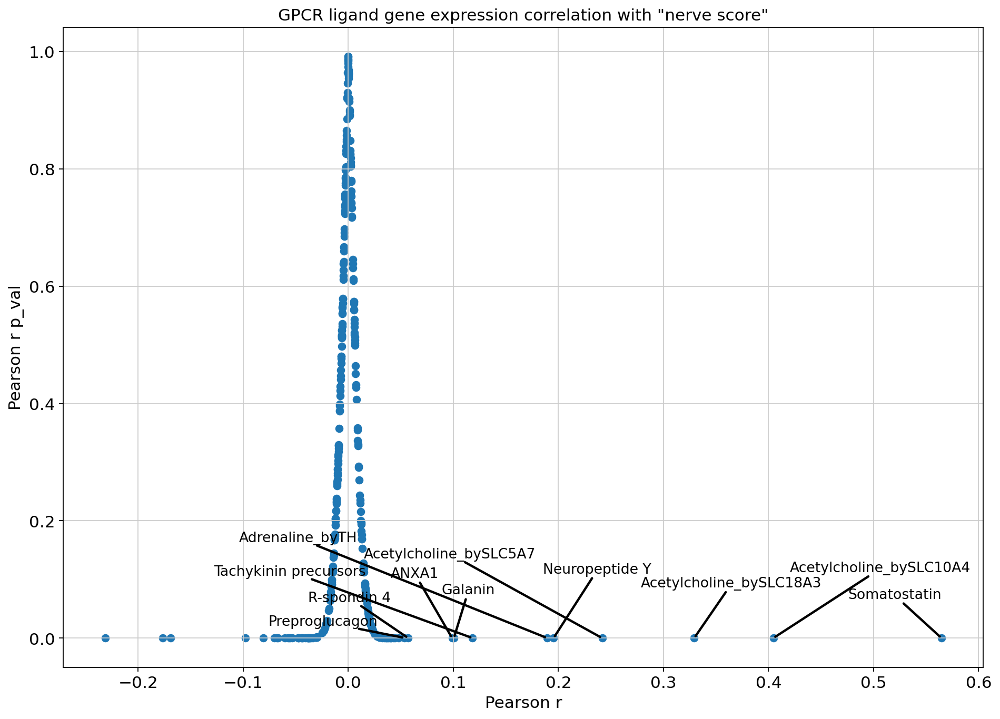

In [136]:
fig, ax = plt.subplots(figsize= (14, 10))

ax.set_ylabel('Pearson r p_val')
ax.set_xlabel('Pearson r')
ax.set_title('GPCR ligand gene expression correlation with "nerve score"')

ax.scatter(corr_df['ligexp_nervescore_corr'], corr_df['ligexp_nervescore_corr_pval'])

TEXTS = []

for i in range(corr_df.shape[0]):
    if corr_df['ligexp_nervescore_corr_pval'].iloc[i] <0.01 and corr_df['ligexp_nervescore_corr'].iloc[i] >0.05:
        x = corr_df['ligexp_nervescore_corr'].iloc[i]
        y = corr_df['ligexp_nervescore_corr_pval'].iloc[i]
        text = ligs_df['ligand_name'].iloc[i]
        TEXTS.append(ax.text(x, y, text, fontsize=12))

adjust_text(
    TEXTS,
    force_text = 0.3,
    force_points = 0.2,
    expand_points=(1, 7),
    arrowprops=dict(
        arrowstyle="-", 
        lw=2
    ),
    ax=fig.axes[0]
)

plt.plot()

In [39]:
# Plot ligands in x,y space that had Pearson r >0.1
corr_ligands = corr_df['lig_symbol'][corr_df['ligexp_nervescore_corr']>0.1].tolist()

In [40]:
corr_ligands

['GAL', 'NPY', 'SST', 'TAC1', 'TH', 'SLC5A7', 'SLC18A3', 'SLC10A4']

In [138]:
adata = sc.read_visium('/nfs/team205/heart/mapped/spaceranger110/ffpe-no-probe-filter/HCAHeartST11702010/')
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
adata.var_names_make_unique()

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [139]:
gene_list = ['PRPH', 'NEFL','NEFM', 'NEFH']
sc.tl.score_genes(adata, gene_list = gene_list, score_name = 'Nerve cytoskeleton score')

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


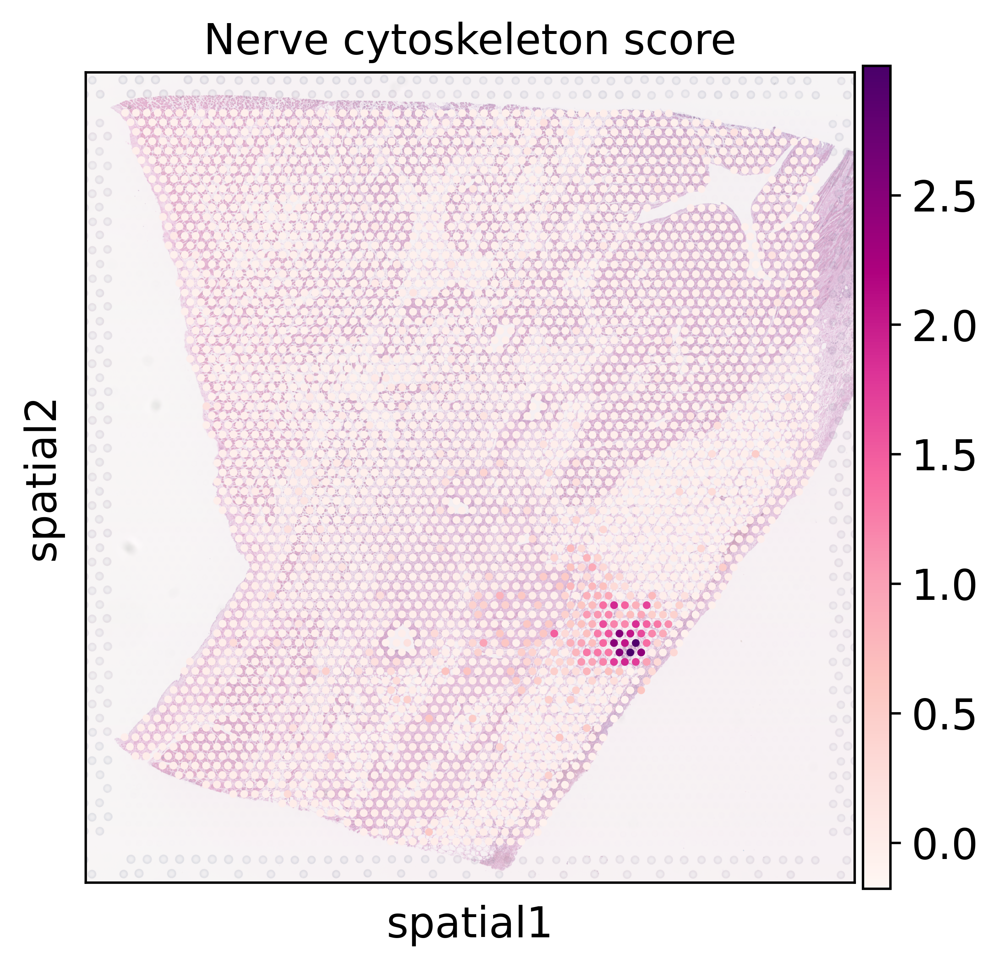

In [150]:
plt.rcParams["figure.figsize"] = (5, 5)
sc.pl.spatial(adata,
             color=['Nerve cytoskeleton score'],
             cmap='RdPu',
             size =1.1,
             alpha_img=0.5,
             ncols=2,
                          save='SuppX_nerve_score_spatial.pdf')

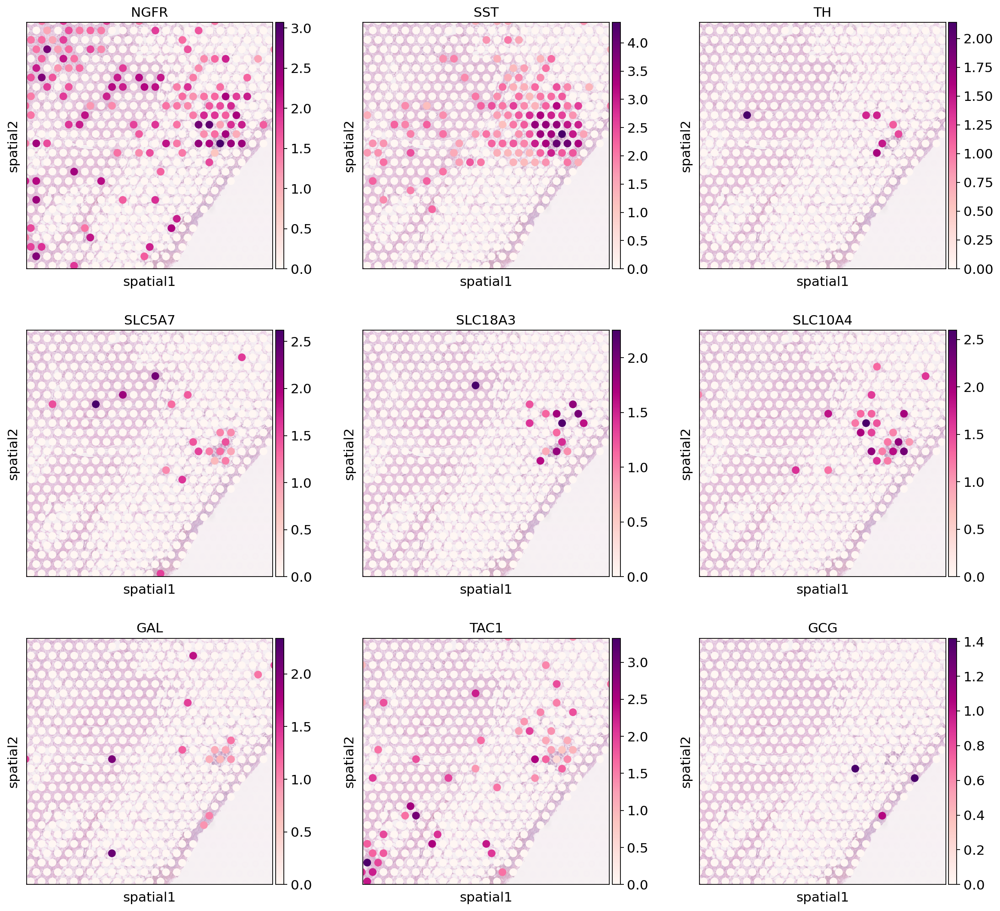

In [163]:
plt.rcParams["figure.figsize"] = (5, 5)
sc.pl.spatial(adata,
             color=['NGFR','SST', 'TH', 'SLC5A7', 'SLC18A3', 'SLC10A4','GAL', 'TAC1', 'GCG'],
             cmap='RdPu',
             size =1.1,
             alpha_img=0.5,
             ncols=3,
             crop_coord=[8000, 13000, 10000, 15000],
             save='SuppX_3by3_neurotransmitter.pdf')

# GCG enriched slide

In [147]:
bdata = sc.read_visium('/nfs/team205/heart/mapped/spaceranger110/ffpe-no-probe-filter/HCAHeartST11702008/')
sc.pp.normalize_total(bdata, inplace=True)
sc.pp.log1p(bdata)
bdata.var_names_make_unique()

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


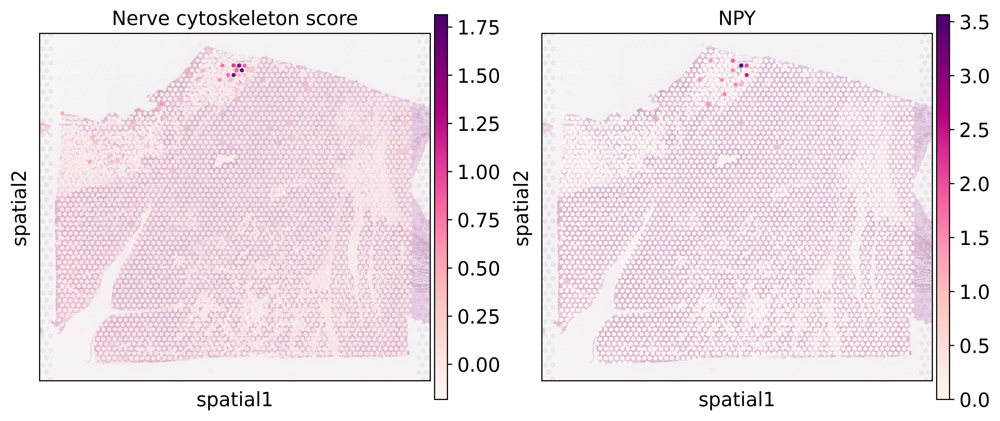

In [160]:
gene_list = ['PRPH', 'NEFL','NEFM', 'NEFH']
sc.tl.score_genes(bdata, gene_list = gene_list, score_name = 'Nerve cytoskeleton score')

plt.rcParams["figure.figsize"] = (5, 5)
sc.pl.spatial(bdata,
             color=['Nerve cytoskeleton score','NPY'],
             cmap='RdPu',
             size =1.1,
             alpha_img=0.5,
             ncols=3,
                          save='SuppX_NPY_spatial.pdf')